# <center>Майнор "Интеллектуальный анализ данных"</center>

# <center>Курс "Введение в анализ данных"</center>

# <center>Лабораторная работа №3. Supervised Learning</center>

## Данные

В рамках данной лабораторной работы вам предлагается проанализировать набор данных о студентах двух школ в Португалии.  
В файле `students_data.csv` представлена информация о студентах, посещающих два курса - математику (`Math`) и поргутальский язык (`Por`). Некоторые студенты представлены в обоих курсах, некоторые - только в одном. Для каждого студента известны три оценки по курсу: оценка за первое полугодие (`G1`), оценка за второе полугодие (`G2`) и итоговая оценка за год (`G3`).

In [100]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings(action='ignore')

In [101]:
import matplotlib.pyplot as plt
import seaborn as sns
import pylab as pl

from sklearn.metrics import  roc_curve,auc,make_scorer,confusion_matrix, mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error,accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
from sklearn.linear_model import Lasso, Ridge, LinearRegression,LogisticRegression
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV,StratifiedKFold,KFold, GridSearchCV, cross_validate, RandomizedSearchCV
from sklearn.preprocessing import PolynomialFeatures,MinMaxScaler,StandardScaler,label_binarize
from sklearn.neighbors import KNeighborsRegressor,KNeighborsClassifier
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor,BaggingClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree,export_graphviz,DecisionTreeRegressor

from IPython.display import Image
from IPython.display import display
from graphviz import Source

import xgboost as xgb
from xgboost import XGBClassifier
import multiprocessing
from xgboost import to_graphviz

from ploc_rot import *

In [102]:
pd.set_option('display.max_columns', 40)

pd.set_option('display.max_colwidth', None)

In [103]:
data = pd.read_csv("students_data.csv")

data.shape

(1044, 36)

In [104]:
data.head(15)

,ID,Subject,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,cheating,G1,G2,G3
0,100097,Por,GP,F,16,U,GT3,A,3,4,services,other,course,father,1,1,0,no,no,no,no,yes,yes,yes,no,3.0,2,1,1.0,4.0,5,12,NaN,15,13,14
1,101021,Por,GP,F,17,U,GT3,T,3,2,other,other,course,mother,1,2,0,no,no,no,yes,no,yes,yes,no,5.0,3,4,1.0,3.0,3,2,NaN,17,18,17
2,102965,Por,GP,M,16,U,LE3,T,1,2,health,services,course,mother,2,1,2,no,no,no,no,no,yes,yes,no,4.0,4,5,3.0,5.0,5,0,yes,9,8,10
3,102989,Por,MS,M,17,U,GT3,T,2,3,other,services,home,father,2,2,0,no,no,no,yes,yes,yes,yes,no,4.0,4,3,1.0,1.0,3,4,no,14,15,16
4,103131,Por,GP,F,16,U,GT3,T,1,1,at_home,other,home,mother,2,1,0,no,yes,no,no,yes,yes,no,NaN,4.0,3,2,1.0,4.0,5,2,yes,12,13,13
5,103144,Por,GP,M,18,U,LE3,T,3,1,services,services,course,mother,2,1,0,no,no,no,yes,yes,yes,yes,yes,3.0,3,4,4.0,5.0,4,2,NaN,11,11,12
6,105257,Por,MS,F,18,U,GT3,T,1,1,other,other,course,mother,2,2,0,no,no,no,yes,yes,yes,no,no,1.0,1,1,1.0,1.0,5,6,NaN,11,12,9
7,107639,Por,MS,F,15,R,GT3,T,4,4,teacher,other,course,mother,2,1,0,no,no,no,no,yes,yes,yes,yes,1.0,5,1,3.0,5.0,5,0,NaN,13,14,14
8,107914,Math,GP,F,15,U,LE3,T,3,2,services,other,reputation,mother,1,2,0,no,yes,yes,no,yes,yes,yes,no,4.0,4,4,1.0,1.0,5,10,no,7,6,6
9,108089,Por,MS,M,16,R,GT3,T,3,4,other,health,other,mother,3,2,0,no,no,no,no,no,yes,no,no,3.0,4,5,1.0,2.0,5,4,NaN,9,10,11


### Признаки

Данные представлены признаками различных типов: числовыми, категориальными, упорядоченными категориальными.

**Описание признаков:**

In [105]:
pd.read_csv('students_data_features.csv',
            delimiter=';',
            encoding='windows-1251')

,Признак,Описание
0,ID,Уникальный номер наблюдения
1,Subject,"Предмет: 'Math' - математика, 'Por' - португальский язык"
2,school,"Школа: 'GP' - Gabriel Pereira, 'MS' - Mousinho da Silveira"
3,sex,"Пол студента: 'F' - женский, 'M' - мужской"
4,age,Возраст студента
5,address,"Место проживания студента: 'U' - в городе, 'R' - за городом"
6,famsize,"Число членов семьи: 'LE3' - если <= 3, 'GT3' - если > 3"
7,Pstatus,"Отношения родителей: 'T' - живут вместе, 'A' - живут раздельно"
8,Medu,"Образование матери: 0 - без образования, 1 - начальная школа, 2 – от 5 до 9 классов, 3 – среднее образование, 4 – высшее образование"
9,Fedu,"Образование отца: 0 - без образования, 1 - начальная школа, 2 – от 5 до 9 классов, 3 – среднее образование, 4 – высшее образование"


## Часть 1. Предобработка данных

* Разделите данные на две части - данные для моделирования (80%) и отложенную выборку (20%). Убедитесь, что распределение целевой переменной (`G3`) одинаково в обоих частях.  
  __NB__: Отложенную выборку нужно использовать только для финальной оценки качества модели. Обучение и кросс-валидацию следует проводить на данных для моделирования.  
* Выполните необходимые преобразования данных: исправление ошибок, удаление выбросов и пропусков, приведение признаков к числовому виду.  
* Оцените значимость признаков для определения итоговой оценки за курс. Исключите из выборки незначимые на ваш взгляд признаки, обоснуйте свое решение. 
* (Опционально) Feature engineering: создайте новые признаки (значимые) на основе уже имеющихся.
  
**Tip:** Используйте свои наработки из Лабораторной работы №1.

In [106]:
data.drop(["ID"], axis = 1, inplace = True)
for column in data.columns.tolist():
    print(column, "=", data[column].unique())

Subject = ['Por' 'Math']
school = ['GP' 'MS']
sex = ['F' 'M' 'm']
age = [16 17 18 15 19 21 20 22]
address = ['U' 'R']
famsize = ['GT3' 'LE3']
Pstatus = ['A' 'T' 't']
Medu = ['3' '1' '2' '4' '0' 'o']
Fedu = ['4' '2' '3' '1' 'o' '0']
Mjob = ['services' 'other' 'health' 'at_home' 'teacher' 'at-home']
Fjob = ['other' 'services' 'health' 'at-home' 'teacher' 'at_home']
reason = ['course' 'home' 'reputation' 'other']
guardian = ['father' 'mother' 'other' 'futher']
traveltime = [1 2 3 4]
studytime = [1 2 4 3]
failures = [0 2 1 3]
schoolsup = ['no' 'yes']
famsup = ['no' 'yes']
paid = ['no' 'yes']
activities = ['no' 'yes']
nursery = ['yes' 'no']
higher = ['yes' 'no']
internet = ['yes' 'no']
romantic = ['no' nan 'yes']
famrel = [ 3.  5.  4.  1.  2. nan]
freetime = [2 3 4 1 5]
goout = [1 4 5 3 2]
Dalc = [ 1.  3.  4.  2.  5. nan]
Walc = [ 4.  3.  5.  1.  2. nan]
health = [5 3 4 2 1]
absences = [12  2  0  4  6 10  7 20 14 11 24  8 16 21  1 18  5 22  9  3 15 26 25 54
 56 40 19 13 38 30 17 28 32 23 75

Сделаем дроп id он в данной ситуации нам не нужен.Чекним столбцы.Ошибки:sex- m,Pstatus - t,Medu - о,Fedu - о,Mjob - at-home,guardian - futher, famrel,Dalc,Walc,cheating,romantic - nan.
Делитним cheating(очень много пропусков, конечно неочень корректно, но ладно) и исправим ошибки в остальных.

In [107]:
# дроп пустоты в колонках medu и fedu,romantic.
data.dropna(subset = ['romantic',"famrel","Dalc","Walc"], inplace = True)
# исправление ошибок
data.guardian.replace("futher", "father", inplace=True)
data.replace("o", "0", inplace=True)
data.sex.replace("M", "m", inplace=True)
data.replace("at-home", "at_home", inplace=True)
data.Pstatus.replace("t", "T", inplace=True)

# заменим типы неправильные
data['famrel'] = data.famrel.astype('int64')
data['Dalc'] = data.Dalc.astype('int64')
data['Walc'] = data.Walc.astype('int64')
data['Medu'] = data['Medu'].apply(pd.to_numeric, errors='coerce',downcast='integer')
data['Fedu'] = data['Fedu'].apply(pd.to_numeric, errors='coerce',downcast='integer')


# чекаем
for column in data.columns.tolist():
    print(column, "=", data[column].unique())

Subject = ['Por' 'Math']
school = ['GP' 'MS']
sex = ['F' 'm']
age = [16 17 18 15 19 21 20 22]
address = ['U' 'R']
famsize = ['GT3' 'LE3']
Pstatus = ['A' 'T']
Medu = [3 1 2 4 0]
Fedu = [4 2 3 1 0]
Mjob = ['services' 'other' 'health' 'teacher' 'at_home']
Fjob = ['other' 'services' 'health' 'at_home' 'teacher']
reason = ['course' 'home' 'reputation' 'other']
guardian = ['father' 'mother' 'other']
traveltime = [1 2 3 4]
studytime = [1 2 4 3]
failures = [0 2 1 3]
schoolsup = ['no' 'yes']
famsup = ['no' 'yes']
paid = ['no' 'yes']
activities = ['no' 'yes']
nursery = ['yes' 'no']
higher = ['yes' 'no']
internet = ['yes' 'no']
romantic = ['no' 'yes']
famrel = [3 5 4 1 2]
freetime = [2 3 4 1 5]
goout = [1 4 5 3 2]
Dalc = [1 3 4 2 5]
Walc = [4 3 5 1 2]
health = [5 3 4 2 1]
absences = [12  2  0  4  6 10  7 20 14 11 24  8 16 21  1 18  5 22  9  3 15 26 25 54
 56 40 13 38 30 17 28 32 23 75]
cheating = [nan 'yes' 'no']
G1 = [15 17  9 14 11 13  7 12 16  6  8 10 18  0  5  3 19  4]
G2 = [13 18  8 15 11 12

In [108]:
abs(data.corr()['G3'])

age           0.117976
Medu          0.207814
Fedu          0.164776
traveltime    0.112519
studytime     0.158775
failures      0.382542
famrel        0.052474
freetime      0.057242
goout         0.092770
Dalc          0.125858
Walc          0.110614
health        0.070054
absences      0.043690
G1            0.807610
G2            0.910560
G3            1.000000
Name: G3, dtype: float64

G3 очень слабо зависит от признаков: Pstatus, famsup,sex, activities, nursery - по модулю < 0.05.
Получается  они скорее всего не оказывают значительного влияния на итоговую оценку, не вкючим их в модели.
Кроме них еще слабо на  G3 влияют: freetime, famsize, famrel, goout, health, schoolsup,paid.

In [109]:
data = data.drop(["sex","Pstatus","activities", "famsup",   "nursery"], axis=1)
data = data.drop(["freetime","goout", "schoolsup","health",   "famsize", "famrel", "paid"], axis=1)

In [110]:
print(data[data.Fjob == "other"].count())
print(data[data.Mjob == "other"].count())

Subject       557
school        557
age           557
address       557
Medu          557
Fedu          557
Mjob          557
Fjob          557
reason        557
guardian      557
traveltime    557
studytime     557
failures      557
higher        557
internet      557
romantic      557
Dalc          557
Walc          557
absences      557
cheating      181
G1            557
G2            557
G3            557
dtype: int64
Subject       387
school        387
age           387
address       387
Medu          387
Fedu          387
Mjob          387
Fjob          387
reason        387
guardian      387
traveltime    387
studytime     387
failures      387
higher        387
internet      387
romantic      387
Dalc          387
Walc          387
absences      387
cheating      124
G1            387
G2            387
G3            387
dtype: int64


#### Количество ответов other Fjob Mjob слишком много, что не дает информации. Их можно тожн убрать из модели.


In [111]:
data = data.drop(["Fjob", "Mjob"], axis=1)

Убираем колонку cheating(из за огромного колличества пропусков)

In [112]:
data = data.drop(['cheating'], axis=1) 

In [113]:
data.head()

,Subject,school,age,address,Medu,Fedu,reason,guardian,traveltime,studytime,failures,higher,internet,romantic,Dalc,Walc,absences,G1,G2,G3
0,Por,GP,16,U,3,4,course,father,1,1,0,yes,yes,no,1,4,12,15,13,14
1,Por,GP,17,U,3,2,course,mother,1,2,0,yes,yes,no,1,3,2,17,18,17
2,Por,GP,16,U,1,2,course,mother,2,1,2,yes,yes,no,3,5,0,9,8,10
3,Por,MS,17,U,2,3,home,father,2,2,0,yes,yes,no,1,1,4,14,15,16
5,Por,GP,18,U,3,1,course,mother,2,1,0,yes,yes,yes,4,5,2,11,11,12


Кодирование двоичных функций

In [114]:
data.replace("no", 0, inplace=True)
data.replace("yes", 1, inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1004 entries, 0 to 1042
Data columns (total 20 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Subject     1004 non-null   object
 1   school      1004 non-null   object
 2   age         1004 non-null   int64 
 3   address     1004 non-null   object
 4   Medu        1004 non-null   int64 
 5   Fedu        1004 non-null   int64 
 6   reason      1004 non-null   object
 7   guardian    1004 non-null   object
 8   traveltime  1004 non-null   int64 
 9   studytime   1004 non-null   int64 
 10  failures    1004 non-null   int64 
 11  higher      1004 non-null   int64 
 12  internet    1004 non-null   int64 
 13  romantic    1004 non-null   int64 
 14  Dalc        1004 non-null   int64 
 15  Walc        1004 non-null   int64 
 16  absences    1004 non-null   int64 
 17  G1          1004 non-null   int64 
 18  G2          1004 non-null   int64 
 19  G3          1004 non-null   int64 
dtypes: int64

In [115]:
# Приведение типов
bin_sex = {"sex": {"M": 1, "m": 1, "F": 0}}
data.replace(bin_sex, inplace=True)

bin_addr = {"address": {"R": 0, "U": 1}}
data.replace(bin_addr, inplace=True)

bin_sch = {"school": {"GP": 0, "MS": 1}}
data.replace(bin_sch, inplace=True)

bin_sub = {"Subject": {"Por": 0, "Math": 1}}
data.replace(bin_sub, inplace=True)

lg_3 = {"famsize": {"LE3": 0, "GT3": 1}}
data.replace(lg_3, inplace=True)

bin_pstat = {"Pstatus": {"A": 0, "T": 1, "t": 1}}
data.replace(bin_pstat, inplace=True)


data.head(15)

,Subject,school,age,address,Medu,Fedu,reason,guardian,traveltime,studytime,failures,higher,internet,romantic,Dalc,Walc,absences,G1,G2,G3
0,0,0,16,1,3,4,course,father,1,1,0,1,1,0,1,4,12,15,13,14
1,0,0,17,1,3,2,course,mother,1,2,0,1,1,0,1,3,2,17,18,17
2,0,0,16,1,1,2,course,mother,2,1,2,1,1,0,3,5,0,9,8,10
3,0,1,17,1,2,3,home,father,2,2,0,1,1,0,1,1,4,14,15,16
5,0,0,18,1,3,1,course,mother,2,1,0,1,1,1,4,5,2,11,11,12
6,0,1,18,1,1,1,course,mother,2,2,0,1,0,0,1,1,6,11,12,9
7,0,1,15,0,4,4,course,mother,2,1,0,1,1,1,3,5,0,13,14,14
8,1,0,15,1,3,2,reputation,mother,1,2,0,1,1,0,1,1,10,7,6,6
9,0,1,16,0,3,4,other,mother,3,2,0,1,0,0,1,2,4,9,10,11
10,0,0,15,1,4,4,course,father,1,1,0,1,1,0,1,3,0,12,13,12


In [116]:
#создадим 2 набора данных для числовых и нечисловых данных 
numerical = data.select_dtypes(exclude=['object'])
categorical = data.select_dtypes(include=['object'])

#One-hot encode нечисловых столбцов

onehot = pd.get_dummies(categorical)

#Объединение столбцов с One-hot encode и  числовых

df = pd.concat([numerical, onehot], axis=1)
df.head()

,Subject,school,age,address,Medu,Fedu,traveltime,studytime,failures,higher,internet,romantic,Dalc,Walc,absences,G1,G2,G3,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other
0,0,0,16,1,3,4,1,1,0,1,1,0,1,4,12,15,13,14,1,0,0,0,1,0,0
1,0,0,17,1,3,2,1,2,0,1,1,0,1,3,2,17,18,17,1,0,0,0,0,1,0
2,0,0,16,1,1,2,2,1,2,1,1,0,3,5,0,9,8,10,1,0,0,0,0,1,0
3,0,1,17,1,2,3,2,2,0,1,1,0,1,1,4,14,15,16,0,1,0,0,1,0,0
5,0,0,18,1,3,1,2,1,0,1,1,1,4,5,2,11,11,12,1,0,0,0,0,1,0


#### Разделим выборки

In [117]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
X = df.drop(["G2", "G3"], axis=1)
y = df["G3"]


# к стандартному виду
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
print(len(X_train))
print(len(X_test))

803
201


# Часть 2. Регрессия

* Решите задачу регрессии: постройте модель, предсказывающую итоговую оценку, которую получит студент по предмету (`G3`). При решении задачи **нельзя** использовать признак `G2`.  
<br>  
* Для решения задачи примените следующие методы:  
  * Линейная регрессия + регуляризации  
  * Полиномиальная регрессия  
  * KNN  
  * Деревья решений, Random Forest  
  
  Для каждого метода выполните настройку гиперпараметров на кросс-валидации.  
<br>    
* Оцените качество каждой модели на отложенной выборке, используйте различные метрики. Сравните модели и сделайте вывод о качестве решения задачи.  
<br>    
* Задачу необходимо решить в двух вариантах: с использованием признака `G1`  и без него. Сравните качество решений в двух случаях.  
<br>    
* В регрессионных моделях попробуйте дать интерпретацию весам признаков. 

# Линейная регрессия

## Решение с признаком G1

In [118]:
def get_model_quality(test_label, preds):
    print("Accuracy:",
      round(metrics.accuracy_score(test_label, preds), 5),
     '\nBalanced accuracy:',
     round(metrics.balanced_accuracy_score(test_label, preds), 5))

    print()
    print(metrics.classification_report(test_label, preds))


def compute_metrics(y_test, y_pred,y_train,y_train_pred):
    print("----------------Test:--------------------")
    print('MSE:', mean_squared_error(y_test, y_pred))
    print('MAE:', mean_absolute_error(y_test, y_pred))
    print('R2:', r2_score(y_test, y_pred))
    print('MAPE:', mean_absolute_percentage_error(y_test, y_pred))
    print("----------------Train:-------------------")
    print('MSE:', mean_squared_error(y_train, y_train_pred))
    print('MAE:', mean_absolute_error(y_train, y_train_pred))
    print('R2:', r2_score(y_train, y_train_pred))
    print('MAPE:', mean_absolute_percentage_error(y_train,y_train_pred))

## Линейная регрессия 

In [119]:
skfold = StratifiedKFold(n_splits=5, shuffle=True)
linear_r = LinearRegression().fit(X_train, y_train) # Fit the training data to a regression line

print("Линейная Регрессия")
print("Training set score: {:.2f}".format(linear_r.score(X_train, y_train)))
print("Test set score: {:.2f}".format(linear_r.score(X_test, y_test)))

# Kfold cross validation
print("Mean Cross-Validation, Kfold: {:.2f}".format(np.mean(cross_val_score(linear_r, X_train, y_train, cv=skfold,scoring = 'explained_variance'))))


Линейная Регрессия
Training set score: 0.68
Test set score: 0.71
Mean Cross-Validation, Kfold: 0.65


----------------Test:--------------------
MSE: 4.741900540179689
MAE: 1.4736073524082403
R2: 0.712582554108932
MAPE: 1765620403833071.5
----------------Train:-------------------
MSE: 4.706142186083853
MAE: 1.4696862520946232
R2: 0.676706973474589
MAPE: 1467821174486354.2


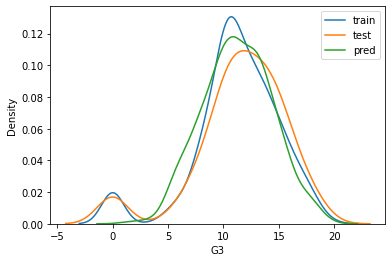

In [120]:
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)
predicted_dependent_variables = regression_model.predict(X_train)

compute_metrics(y_test, regression_model.predict(X_test),y_train,predicted_dependent_variables)
sns.kdeplot(y_train, label='train')
sns.kdeplot(y_test, label='test')
sns.kdeplot(predicted_dependent_variables, label='pred')
plt.legend()
plt.show()


## Полиномиальная регрессия 

Original number of features: 23
Number of features after polynomial transformation: 299
----------------Test:--------------------
MSE: 6.218898496446918
MAE: 1.790131981693097
R2: 0.6230583271498048
MAPE: 1465780284795888.8
----------------Train:-------------------
MSE: 2.766562176652596
MAE: 1.2380521591395548
R2: 0.8099483135453208
MAPE: 805684603251935.1


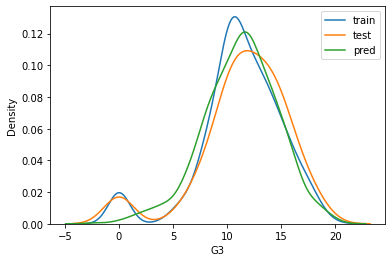

In [121]:
poly_r = PolynomialFeatures(degree=2, include_bias=False)
poly_r.fit(X_train)

poly_train = poly_r.transform(X_train)
poly_test = poly_r.transform(X_test)

print('Original number of features:', X_train.shape[1])
print('Number of features after polynomial transformation:', poly_train.shape[1])

regressionModel = LinearRegression(normalize=True)
regressionModel.fit(poly_train, y_train)

compute_metrics(y_test, regressionModel.predict(poly_test),y_train,regressionModel.predict(poly_train))

sns.kdeplot(y_train, label='train')
sns.kdeplot(y_test, label='test')
sns.kdeplot(regressionModel.predict(poly_train), label='pred')
plt.legend()
plt.show()

Original number of features: 23
Number of features after polynomial transformation: 299
----------------Test:--------------------
MSE: 4.963536521964127
MAE: 1.4515597310785018
R2: 0.6991486899309987
MAPE: 1896562438548292.8
----------------Train:-------------------
MSE: 4.407333925399939
MAE: 1.3816523476600056
R2: 0.6972338983161188
MAPE: 1497550025678767.0


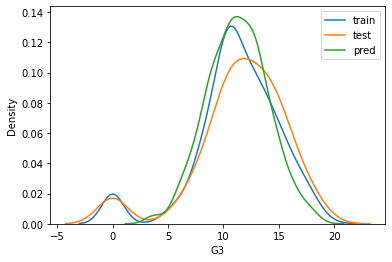

In [122]:
poly_r = PolynomialFeatures(degree=2, include_bias=False)
poly_r.fit(X_train)

poly_train = poly_r.transform(X_train)
poly_test = poly_r.transform(X_test)

print('Original number of features:', X_train.shape[1])
print('Number of features after polynomial transformation:', poly_train.shape[1])

regression_model = Ridge(normalize=True)
regression_model.fit(poly_train, y_train)

compute_metrics(y_test, regression_model.predict(poly_test),y_train,regression_model.predict(poly_train))

sns.kdeplot(y_train, label='train')
sns.kdeplot(y_test, label='test')
sns.kdeplot(regression_model.predict(poly_train), label='pred')
plt.legend()
plt.show()

Original number of features: 23
Number of features after polynomial transformation: 2599
----------------Test:--------------------
MSE: 4.496386293528581
MAE: 1.4541955283124377
R2: 0.7274637345774825
MAPE: 1616977482734732.0
----------------Train:-------------------
MSE: 3.0180712761236883
MAE: 1.1916672369985926
R2: 0.7926706507056538
MAPE: 1070669095149060.0


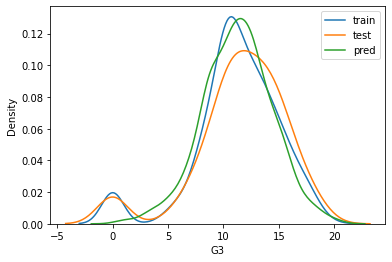

In [123]:
poly_r = PolynomialFeatures(degree=3, include_bias=False)
poly_r.fit(X_train)

poly_train = poly_r.transform(X_train)
poly_test = poly_r.transform(X_test)

print('Original number of features:', X_train.shape[1])
print('Number of features after polynomial transformation:', poly_train.shape[1])

regression_model = Ridge(normalize=True)
regression_model.fit(poly_train, y_train)

compute_metrics(y_test, regression_model.predict(poly_test),y_train,regression_model.predict(poly_train))
sns.kdeplot(y_train, label='train')
sns.kdeplot(y_test, label='test')
sns.kdeplot(regression_model.predict(poly_train), label='pred')
plt.legend()
plt.show()

## KNN

In [124]:
knn = KNeighborsClassifier().fit(X_train, y_train)

print("KNN Классификатор")
print("Training set score: {:.2f}".format(knn.score(X_train, y_train)))
print("Test set score: {:.2f}".format(knn.score(X_test, y_test)))

# Kfold Cross Validation
print("Mean Cross Validation, KFold: {:.2f}".format(np.mean(cross_val_score(knn, X_train, y_train, cv=skfold,scoring = 'explained_variance'))))


KNN Классификатор
Training set score: 0.50
Test set score: 0.25
Mean Cross Validation, KFold: 0.46


In [125]:
knn = KNeighborsRegressor().fit(X_train, y_train)

print("KNN Регрессия")
print("Training set score: {:.2f}".format(knn.score(X_train, y_train)))
print("Test set score: {:.2f}".format(knn.score(X_test, y_test)))

# Kfold Cross Validation
print("Mean Cross Validation, KFold: {:.2f}".format(np.mean(cross_val_score(knn, X_train, y_train, cv=skfold,scoring = 'explained_variance'))))

KNN Регрессия
Training set score: 0.77
Test set score: 0.73
Mean Cross Validation, KFold: 0.64


In [126]:

params = {
    'kneighborsregressor__n_neighbors': [1,2,3,4,5,6,7,8,9,10,15,20,50,100]
}

kf = KFold(n_splits=10, shuffle=True)
knn = KNeighborsRegressor()
scaler = StandardScaler()

knrModel = make_pipeline(
    scaler, 
    knn
)

gd = GridSearchCV(knrModel, params, cv=kf, scoring = 'explained_variance')

gd.fit(X_train, y_train)

print(gd.best_params_,gd.best_score_)


{'kneighborsregressor__n_neighbors': 20} 0.4294064706908195


----------------Test:--------------------
MSE: 8.935995024875622
MAE: 2.0079601990049754
R2: 0.45836888716191493
MAPE: 2426566366389178.0
----------------Train:-------------------
MSE: 7.528409090909091
MAE: 1.902428393524284
R2: 0.4828285963993072
MAPE: 1916974287216980.5


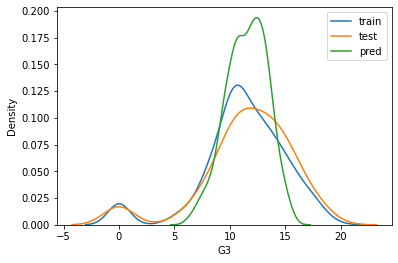

In [127]:
best = gd.best_estimator_

# best.fit(X_train_scaled, y_train)
y_pred = best.predict(X_test)
y_pred_train = best.predict(X_train)

compute_metrics(y_test, y_pred,y_train, y_pred_train)
sns.kdeplot(y_train, label='train')
sns.kdeplot(y_test, label='test')
sns.kdeplot(y_pred_train, label='pred')
plt.legend()
plt.show()

## Гребневая регрессия

In [128]:
ridge = Ridge(alpha=0.01, max_iter=100000).fit(X_train, y_train) 
print("Гребневая Регрессия")
print("Training set score: {:.2f}".format(ridge.score(X_train, y_train)))
print("Test set score: {:.2f}".format(ridge.score(X_test, y_test)))


print("Mean Cross-Validation, Kfold: {:.2f}".format(np.mean(cross_val_score(ridge, X_train, y_train, cv=skfold,scoring = 'explained_variance'))))

Гребневая Регрессия
Training set score: 0.68
Test set score: 0.71
Mean Cross-Validation, Kfold: 0.66


----------------Test:--------------------
MSE: 4.858897864913678
MAE: 1.461830906537126
R2: 0.7054910784513981
MAPE: 1855751859311614.8
----------------Train:-------------------
MSE: 4.757360538654054
MAE: 1.4552439278988059
R2: 0.6731884788007497
MAPE: 1526408478601176.2
{'alpha': 100.0} 0.6561952339518977


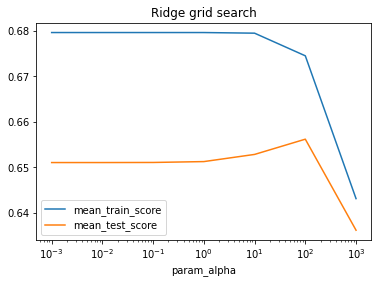

In [129]:
param_grid = {'alpha': np.logspace(-3, 3, 7)}
grid = GridSearchCV(Ridge(), param_grid, cv=skfold,scoring = 'explained_variance', return_train_score=True)
grid.fit(X_train, y_train)
y_pred = grid.predict(X_test)
y_train_pred = grid.predict(X_train)
compute_metrics(y_test, y_pred,y_train, y_train_pred)
res = pd.DataFrame(grid.cv_results_)
res.plot("param_alpha", ["mean_train_score", "mean_test_score"], logx=True)
plt.title("Ridge grid search")
print(grid.best_params_, grid.best_score_)

## Lasso

In [130]:
lasso = Lasso(alpha=0.01, max_iter=100000).fit(X_train, y_train) 

print("Lasso")
print("Test set score: {:.2f}".format(lasso.score(X_test, y_test)))

# Kfold cross validation
print("Mean Cross-Validation, Kfold: {:.2f}".format(np.mean(cross_val_score(lasso, X_train, y_train, cv=skfold,scoring = 'explained_variance'))))

Lasso
Test set score: 0.71
Mean Cross-Validation, Kfold: 0.66


In [131]:
param_grid = {'alpha': np.logspace(-3, 3, 7)}
grid_lasso = GridSearchCV(Lasso(), param_grid, cv=skfold, scoring = 'explained_variance',return_train_score=True)
grid_lasso.fit(X_train, y_train)
y_pred = grid_lasso.predict(X_test)
y_train_pred = grid_lasso.predict(X_train)

compute_metrics(y_test, y_pred,y_train, y_train_pred)

print(grid_lasso.best_params_, grid_lasso.best_score_)

----------------Test:--------------------
MSE: 4.772213345707094
MAE: 1.4718523582488416
R2: 0.7107452255802849
MAPE: 1785949676603748.5
----------------Train:-------------------
MSE: 4.712417213220941
MAE: 1.4636609000282452
R2: 0.6762759043665034
MAPE: 1478278963561651.2
{'alpha': 0.01} 0.663889553877155


## Random Forest

In [132]:
random_forest = RandomForestClassifier().fit(X_train, y_train)

print("Random forest(KNN Регрессия)")
print("Training set score: {:.2f}".format(random_forest.score(X_train, y_train)))
print("Test set score: {:.2f}".format(random_forest.score(X_test, y_test)))

# Kfold Cross Validation
print("Mean Cross Validation, KFold: {:.2f}".format(np.mean(cross_val_score(random_forest, X_train, y_train, cv=skfold))))

Random forest(KNN Регрессия)
Training set score: 1.00
Test set score: 0.27
Mean Cross Validation, KFold: 0.28


In [133]:

params = {'n_estimators': range(50, 101, 25), 'max_depth': [30], 'min_samples_split': range(2, 11, 2)}
grid = RandomizedSearchCV(RandomForestClassifier(criterion='entropy'), params, n_iter=20, cv=skfold,scoring = 'explained_variance', verbose=4)
grid.fit(X_train, y_train)
best = grid.best_estimator_
y_pred = best.predict(X_test)
get_model_quality(y_test, y_pred)

Fitting 5 folds for each of 15 candidates, totalling 75 fits
[CV 1/5] END max_depth=30, min_samples_split=2, n_estimators=50;, score=0.441 total time=   0.1s
[CV 2/5] END max_depth=30, min_samples_split=2, n_estimators=50;, score=0.526 total time=   0.1s
[CV 3/5] END max_depth=30, min_samples_split=2, n_estimators=50;, score=0.486 total time=   0.1s
[CV 4/5] END max_depth=30, min_samples_split=2, n_estimators=50;, score=0.523 total time=   0.1s
[CV 5/5] END max_depth=30, min_samples_split=2, n_estimators=50;, score=0.440 total time=   0.1s
[CV 1/5] END max_depth=30, min_samples_split=2, n_estimators=75;, score=0.478 total time=   0.1s
[CV 2/5] END max_depth=30, min_samples_split=2, n_estimators=75;, score=0.561 total time=   0.1s
[CV 3/5] END max_depth=30, min_samples_split=2, n_estimators=75;, score=0.433 total time=   0.2s
[CV 4/5] END max_depth=30, min_samples_split=2, n_estimators=75;, score=0.529 total time=   0.2s
[CV 5/5] END max_depth=30, min_samples_split=2, n_estimators=75;, 

In [134]:
random_forest = RandomForestRegressor().fit(X_train, y_train)

print("Random Forest Регрессия")
print("Training set score: {:.2f}".format(random_forest.score(X_train, y_train)))
print("Test set score: {:.2f}".format(random_forest.score(X_test, y_test)))


print("Mean Cross Validation, KFold: {:.2f}".format(np.mean(cross_val_score(random_forest, X_train, y_train, cv=skfold,scoring = 'explained_variance'))))

Random Forest Регрессия
Training set score: 0.96
Test set score: 0.78
Mean Cross Validation, KFold: 0.71


In [135]:
params_random_forest = {
  'n_estimators': [50, 100, 200,300, 400, 500],
  'max_depth': [4, 6, 8],
  'min_samples_leaf': [.1, .2],
  'max_features': ['log2', 'sqrt']
}


random_forest = RandomForestRegressor(random_state = 17)
grid_random_forest = GridSearchCV(estimator=random_forest, param_grid = params_random_forest, cv = skfold, scoring='explained_variance', n_jobs = -1)

grid_random_forest.fit(X_train, y_train)


best_hyperparams = grid_random_forest.best_params_
print('Best hyperparameters:\n', best_hyperparams)


Best hyperparameters:
 {'max_depth': 4, 'max_features': 'log2', 'min_samples_leaf': 0.1, 'n_estimators': 100}


In [136]:

print(grid_random_forest.best_score_)
best_model = grid_random_forest.best_estimator_


y_pred = best_model.predict(X_test)
y_train_pred = best_model.predict(X_train)

compute_metrics(y_test, y_pred,y_train, y_train_pred)

0.34991401731443583
----------------Test:--------------------
MSE: 10.588675563832153
MAE: 2.210246168423968
R2: 0.3581961367307639
MAPE: 2636838573499227.0
----------------Train:-------------------
MSE: 9.288257253042723
MAE: 2.0493443245461958
R2: 0.3619341108387669
MAPE: 2143131897482848.5


## Деревья решений

In [137]:
params_d = {
  'max_depth': [3, 4, 5, 6],
  'min_samples_leaf': [.04, .06, .08],
  'max_features': [.2, .4, .6, .8]
}
SEED = 1


dt = DecisionTreeClassifier(random_state=SEED)

grid_dt= GridSearchCV(estimator=dt, param_grid = params_d, cv = skfold, n_jobs=-1)


grid_dt.fit(X_train, y_train)


best_hyperparams = grid_dt.best_params_
print('Best hyperparameters:\n' , best_hyperparams)


best_score = grid_dt.best_score_
print('Best '.format(best_score))


best_model = grid_dt.best_estimator_

y_pred = best_model.predict(X_test)
get_model_quality(y_test, y_pred)

Best hyperparameters:
 {'max_depth': 4, 'max_features': 0.8, 'min_samples_leaf': 0.06}
Best 
Accuracy: 0.32836 
Balanced accuracy: 0.2493

              precision    recall  f1-score   support

           0       0.75      0.75      0.75        12
           5       0.00      0.00      0.00         1
           6       0.00      0.00      0.00         3
           7       0.00      0.00      0.00         5
           8       0.07      0.10      0.08        10
           9       0.00      0.00      0.00        10
          10       0.26      0.62      0.37        24
          11       0.33      0.24      0.28        25
          12       0.27      0.19      0.22        21
          13       0.42      0.50      0.46        22
          14       0.00      0.00      0.00        21
          15       0.39      0.75      0.52        20
          16       0.00      0.00      0.00        12
          17       0.00      0.00      0.00         7
          18       0.25      0.83      0.38       

In [138]:
bag = BaggingClassifier(n_estimators=30, base_estimator=DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_split=5))
bag.fit(X_train, y_train)
y_pred = bag.predict(X_test)
get_model_quality(y_test, y_pred)

Accuracy: 0.33831 
Balanced accuracy: 0.27089

              precision    recall  f1-score   support

           0       0.83      0.83      0.83        12
           5       0.00      0.00      0.00         1
           6       0.00      0.00      0.00         3
           7       0.00      0.00      0.00         5
           8       0.23      0.50      0.31        10
           9       0.00      0.00      0.00        10
          10       0.26      0.46      0.33        24
          11       0.30      0.40      0.34        25
          12       0.20      0.05      0.08        21
          13       0.36      0.45      0.40        22
          14       0.25      0.05      0.08        21
          15       0.44      0.70      0.54        20
          16       0.08      0.08      0.08        12
          17       0.50      0.14      0.22         7
          18       0.50      0.67      0.57         6
          19       0.00      0.00      0.00         2

    accuracy                     

### Лучше всего  с данной  задачейй справляется регрессия(результат по R2: 0.64). Лучшие результаты достигаются в Lasso и  Гребневой регрессии, но данный результат все равно недостаточно хороший. Полиномиальная регресия с повышением степени полинома начинает подстраиваться под данные. 

## Решение задачи регрессии без включения признака G1
#### Отдельное рассмотрение оценок по португальскому и математике

In [139]:
df.head()
X2 = df.drop(["G2", "G1"], axis=1) # без G1
X_m = X2[X2["Subject"] == 1].drop("G3", axis=1)
X_p = X2[X2["Subject"] == 0].drop("G3", axis=1)
y_m = X2[X2["Subject"] == 1]["G3"]
y_p = X2[X2["Subject"] == 0]["G3"]
X2.head()

,Subject,school,age,address,Medu,Fedu,traveltime,studytime,failures,higher,internet,romantic,Dalc,Walc,absences,G3,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other
0,0,0,16,1,3,4,1,1,0,1,1,0,1,4,12,14,1,0,0,0,1,0,0
1,0,0,17,1,3,2,1,2,0,1,1,0,1,3,2,17,1,0,0,0,0,1,0
2,0,0,16,1,1,2,2,1,2,1,1,0,3,5,0,10,1,0,0,0,0,1,0
3,0,1,17,1,2,3,2,2,0,1,1,0,1,1,4,16,0,1,0,0,1,0,0
5,0,0,18,1,3,1,2,1,0,1,1,1,4,5,2,12,1,0,0,0,0,1,0


In [140]:
x_train_math, x_test_math, y_train_math, y_test_math = train_test_split(X_m, y_m, test_size=0.2)
x_train_por, x_test_por, y_train_por, y_test_por = train_test_split(X_p, y_p, test_size=0.2)

## Линейная регрессия

In [141]:
print("Math",cross_val_score(LinearRegression(), X_m, y_m, cv=10))
print("",end="\n\n")
print("Portuguese",cross_val_score(LinearRegression(), X_p, y_p, cv=10))

Math [-0.06049171  0.1845358   0.22128403 -0.08900579  0.08267574 -0.02840901
 -0.04900783  0.19352002  0.0911179   0.07181223]


Portuguese [ 0.3576577  -0.03780882  0.14651572  0.21870755  0.26994016  0.30385042
  0.3761543   0.27546982  0.26086479  0.41935673]


In [142]:
regression_model = LinearRegression() 
regression_model.fit(x_train_por, y_train_por)
y_pred = regression_model.predict(x_test_por)
y_train_pred = regression_model.predict(x_train_por)
print("Portuguese:")
compute_metrics(y_test_por, y_pred,y_train_por, y_train_pred)

regression_model.fit(x_train_math, y_train_math)
y_pred = regression_model.predict(x_test_math)
y_train_pred = regression_model.predict(x_train_math)
print("",end="\n\n")

print("Math:")
compute_metrics(y_test_math, y_pred,y_train_math, y_train_pred)

Portuguese:
----------------Test:--------------------
MSE: 8.19044945464834
MAE: 2.0521795043250095
R2: 0.27531896119458943
MAPE: 1173203800029750.0
----------------Train:-------------------
MSE: 6.616284075859555
MAE: 1.9058278726188669
R2: 0.33109044714938163
MAPE: 803099561772446.0


Math:
----------------Test:--------------------
MSE: 21.933187685633424
MAE: 3.739370576312547
R2: 0.021849871272903276
MAPE: 4138632100118279.5
----------------Train:-------------------
MSE: 16.463202617716156
MAE: 3.1153502682828615
R2: 0.2183690860637444
MAPE: 3550847635506722.0


## Гребневая регрессия

In [143]:
print("Math",cross_val_score(Ridge(), X_m, y_m, cv=10))
print("",end="\n\n")
print("Portuguese",cross_val_score(Ridge(), X_p, y_p, cv=10))

Math [-0.05636467  0.1872715   0.22098065 -0.08950093  0.08281533 -0.02035863
 -0.04677416  0.19364502  0.09370284  0.07237146]


Portuguese [ 0.35814024 -0.0361958   0.14633408  0.21896459  0.27049009  0.30473105
  0.37611765  0.27625287  0.26320009  0.41784265]


In [144]:
param_grid = {'alpha': np.logspace(-3, 3, 7)}
grid = GridSearchCV(Ridge(), param_grid, cv=10, return_train_score=True)


grid.fit(x_train_por, y_train_por)
y_pred = grid.predict(x_test_por)
y_train_pred = grid.predict(x_train_por)
print("Portuguese:")
compute_metrics(y_test_por, y_pred,y_train_por, y_train_pred)
print("",end="\n\n")
grid.fit(x_train_math, y_train_math)
y_pred = grid.predict(x_test_math)
y_train_pred = grid.predict(x_train_math)
print("Math:")
compute_metrics(y_test_math, y_pred,y_train_math, y_train_pred)

Portuguese:
----------------Test:--------------------
MSE: 8.13517664535986
MAE: 2.0369527979659035
R2: 0.280209432355502
MAPE: 1171014915958325.2
----------------Train:-------------------
MSE: 6.630150645717451
MAE: 1.9001018379816956
R2: 0.3296885301614064
MAPE: 815966044656933.8


Math:
----------------Test:--------------------
MSE: 21.493403117071885
MAE: 3.6263908866234935
R2: 0.04146285861046339
MAPE: 4500846946657714.5
----------------Train:-------------------
MSE: 17.069461465465274
MAE: 3.1764668133828318
R2: 0.18958546065065796
MAPE: 3888324162584433.5


## Lasso

In [145]:
print("Math",cross_val_score(Lasso(), X_m, y_m, cv=10))
print("",end="\n\n")
print("Portuguese",cross_val_score(Lasso(), X_p, y_p, cv=10))

Math [-0.07542398  0.03269681  0.06066383 -0.06717125 -0.04352652  0.03260639
 -0.00751831  0.0039264   0.08917887  0.01414054]


Portuguese [-0.00478109 -0.01120731 -0.01396083 -0.01522679  0.00144538 -0.01031723
  0.00639734  0.00348584 -0.01626244 -0.04074803]


In [146]:
param_grid = {'alpha': np.logspace(-3, 3, 7)}
grid  = GridSearchCV(Lasso(), param_grid, cv=10, return_train_score=True)
grid.fit(x_train_por, y_train_por)
y_pred = grid.predict(x_test_por)
y_train_pred = grid.predict(x_train_por)
print("Portuguese:")
compute_metrics(y_test_por, y_pred,y_train_por, y_train_pred)
print("",end="\n\n")
grid.fit(x_train_math, y_train_math)
y_pred = grid.predict(x_test_math)
y_train_pred = grid.predict(x_train_math)
print("Math:")
compute_metrics(y_test_math, y_pred,y_train_math, y_train_pred)

Portuguese:
----------------Test:--------------------
MSE: 8.161482765141104
MAE: 2.0473423817767435
R2: 0.2778818987670745
MAPE: 1172688020878467.0
----------------Train:-------------------
MSE: 6.6207398625419005
MAE: 1.903671263121235
R2: 0.33063996493865544
MAPE: 810127395197644.1


Math:
----------------Test:--------------------
MSE: 21.448992037143864
MAE: 3.6354661349842634
R2: 0.043443450951674234
MAPE: 4334980883453612.0
----------------Train:-------------------
MSE: 16.965466705464834
MAE: 3.1636989717464683
R2: 0.19452286688875253
MAPE: 3791650225867697.0


## Дерево решений

In [147]:
print("Math",cross_val_score(DecisionTreeRegressor(random_state=17), X_m, y_m, cv=10))
print("",end="\n\n")
print("Portuguese",cross_val_score(DecisionTreeRegressor(random_state=17), X_p, y_p, cv=10))

Math [-0.91313364 -0.2765179  -0.49042987 -0.59214799 -0.64373763 -0.25613692
 -0.83140531 -0.73109351 -1.53040522  0.19437308]


Portuguese [-0.1384507  -0.2387125  -0.85450233 -0.50962554 -0.18523644 -0.98876535
 -0.05517952 -0.26825185 -0.0869195  -0.10773145]


In [148]:
parameters = {'max_depth': range(2, 6)}
tree = DecisionTreeRegressor(random_state=17)
model = GridSearchCV(tree, parameters, cv=10, n_jobs = -1)
model.fit(x_train_por, y_train_por)
print("Portuguese")
print(model.best_score_)
print("",end="\n\n")
model.fit(x_train_math, y_train_math)
print("Math")
print(model.best_score_)

Portuguese
0.2102948786238225


Math
0.12351425433968663


## KNeighborsRegressor

In [149]:
print("Math",cross_val_score(KNeighborsRegressor(), X_m, y_m, cv=10))
print("",end="\n\n")
print("Portuguese",cross_val_score(KNeighborsRegressor(), X_p, y_p, cv=10))

Math [-0.50458986  0.02062121  0.15909095 -0.50876131  0.1619075   0.28329584
  0.02275469  0.20255185  0.01251673  0.30621305]


Portuguese [ 0.25718598 -0.16393096  0.04404967  0.14079279  0.20276609  0.09266184
  0.10763934  0.08406916  0.18824149  0.33526696]


In [150]:
parameters = {'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
              'metric': ['manhattan', 'minkowski', 'euclidean'], 'n_neighbors': range(3, 9)}
estimator = KNeighborsRegressor()
model = GridSearchCV(estimator, parameters, cv=10, n_jobs = -1)
model.fit(x_train_por, y_train_por)
print("Portuguese")
print(model.best_score_)
model.fit(x_train_math, y_train_math)
print("",end="\n\n")
print("Math")
print(model.best_score_)

Portuguese
0.1504573265106087


Math
0.08043383858399236


### Без признака G1 результаты вышли ужасные:  очень низкая точность, в некоторых моделях предсказание получается хуже константного(коэффициент детерминации отрицательный).

## Часть 3. Бинарная классификация

Решите задачу бинарной классификации: постройте модель, предсказывающую, сдаст студент предмет (`G3` >= 8) или не сдаст (`G3` < 8). <br>При решении задачи **нельзя** использовать признаки `G1` и `G2`.  


### Задание 1  
  
* Постройте дерево решений глубины 5 (остальные параметры по умолчанию), оцените качество на 5-fold валидации.  
* Для одного из деревьев (т.е. обученного на одной из итераций кросс-валидации) выведите само дерево - постройте график или выведите в текстовом виде. По структуре дерева сформулируйте правила, по которым принимается решение.  
* Сравните между собой деревья решений, полученных на различных итерациях 5-fold валидации. Сделайте вывод, насколько сильно они похожи или различаются между собой. 

In [151]:
df.head()

,Subject,school,age,address,Medu,Fedu,traveltime,studytime,failures,higher,internet,romantic,Dalc,Walc,absences,G1,G2,G3,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other
0,0,0,16,1,3,4,1,1,0,1,1,0,1,4,12,15,13,14,1,0,0,0,1,0,0
1,0,0,17,1,3,2,1,2,0,1,1,0,1,3,2,17,18,17,1,0,0,0,0,1,0
2,0,0,16,1,1,2,2,1,2,1,1,0,3,5,0,9,8,10,1,0,0,0,0,1,0
3,0,1,17,1,2,3,2,2,0,1,1,0,1,1,4,14,15,16,0,1,0,0,1,0,0
5,0,0,18,1,3,1,2,1,0,1,1,1,4,5,2,11,11,12,1,0,0,0,0,1,0


In [152]:
bin_df = df.copy()
for index, row in bin_df.iterrows():
    if (bin_df.at[index, 'G3'] < 8):
        bin_df.at[index, 'G3'] = 0
    else:
        bin_df.at[index, 'G3'] = 1

bin_df.head() 

,Subject,school,age,address,Medu,Fedu,traveltime,studytime,failures,higher,internet,romantic,Dalc,Walc,absences,G1,G2,G3,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other
0,0,0,16,1,3,4,1,1,0,1,1,0,1,4,12,15,13,1,1,0,0,0,1,0,0
1,0,0,17,1,3,2,1,2,0,1,1,0,1,3,2,17,18,1,1,0,0,0,0,1,0
2,0,0,16,1,1,2,2,1,2,1,1,0,3,5,0,9,8,1,1,0,0,0,0,1,0
3,0,1,17,1,2,3,2,2,0,1,1,0,1,1,4,14,15,1,0,1,0,0,1,0,0
5,0,0,18,1,3,1,2,1,0,1,1,1,4,5,2,11,11,1,1,0,0,0,0,1,0


In [153]:
X = bin_df.drop(["G1", "G2", "G3"], axis = 1)
y =bin_df["G3"]
feature_names = X.columns

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle=True, random_state = 17, stratify=y)
X.head()

,Subject,school,age,address,Medu,Fedu,traveltime,studytime,failures,higher,internet,romantic,Dalc,Walc,absences,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other
0,0,0,16,1,3,4,1,1,0,1,1,0,1,4,12,1,0,0,0,1,0,0
1,0,0,17,1,3,2,1,2,0,1,1,0,1,3,2,1,0,0,0,0,1,0
2,0,0,16,1,1,2,2,1,2,1,1,0,3,5,0,1,0,0,0,0,1,0
3,0,1,17,1,2,3,2,2,0,1,1,0,1,1,4,0,1,0,0,1,0,0
5,0,0,18,1,3,1,2,1,0,1,1,1,4,5,2,1,0,0,0,0,1,0


In [154]:
print(y_train.value_counts(normalize=True))
print(y_test.value_counts(normalize=True))

1    0.902864
0    0.097136
Name: G3, dtype: float64
1    0.900498
0    0.099502
Name: G3, dtype: float64


In [155]:
cvs = cross_val_score(DecisionTreeClassifier(random_state=17), X, y, cv=5)
print(cvs)
print("\n\n", cvs.mean())

[0.87064677 0.86567164 0.82089552 0.86069652 0.825     ]


 0.8485820895522389


In [156]:
model = DecisionTreeClassifier(max_depth = 5, random_state=17).fit(X_train, y_train)

y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)
print(roc_auc_score(y_test, y_pred_proba[:, 1]))
model

0.6640883977900554


DecisionTreeClassifier(max_depth=5, random_state=17)

Best hyperparameters:
 {'max_depth': 5, 'max_features': 0.8, 'min_samples_leaf': 0.04}
Best  0.907833850931677


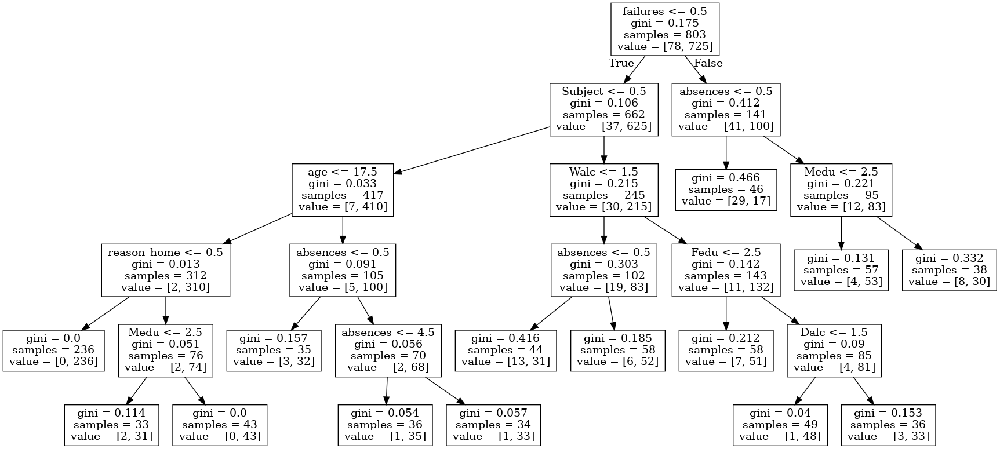

In [157]:
params_dt = {
  'max_depth': [5],
  'min_samples_leaf': [.04, .06, .08],
  'max_features': [.2, .4, .6, .8]
}
SEED = 1

dt = DecisionTreeClassifier(random_state=SEED)

grid_dt= GridSearchCV(estimator=dt, param_grid = params_dt, cv = 5, n_jobs=-1)


grid_dt.fit(X_train, y_train)


best_hyperparams = grid_dt.best_params_
print('Best hyperparameters:\n' , best_hyperparams)


best_score = grid_dt.best_score_
print('Best ',(best_score))


best_model = grid_dt.best_estimator_

graph = Source(export_graphviz(best_model, out_file=None, feature_names=feature_names))
png = graph.pipe(format='png')
Image(png)

#### Описание работы алгоритма дерева:
Правило1 - деление по наличию предыдущих провалов экзаменов
Правило2 - у тех, кто проваливал - по предмету  ; для не проваливавших - по пропускам
Правило3:
Провалы <1 - изучают математику - по дозе алкоголя
Провалы <1 - изучают португальский  - по пропускам
Провалов >0 - пропуски есть - достигли листа
Провалов >0 - прпусков нет - по образованию матери

### Задание 2  
  
На кросс-валидации (5-fold из 2 повторений) оцените, как меняется качество модели Random Forest с ростом числа деревьев (при дефолтных значениях остальных параметров). Провизуализируйте результаты. Сколько деревьев достаточно в данном случае и почему?  
**NB:** В сравнение включите конфигурацию, аналогичную простому дереву решений. 

0.850592039800995
Train: 0.9414694894146949
Test: 0.8905472636815921


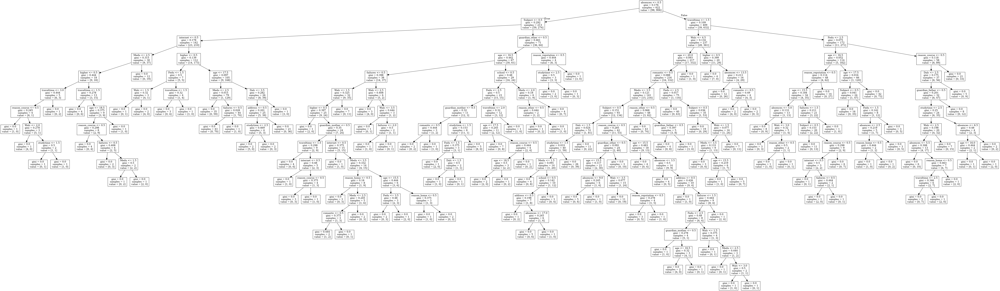

0.8177611940298506
Train: 0.9514321295143213
Test: 0.9253731343283582


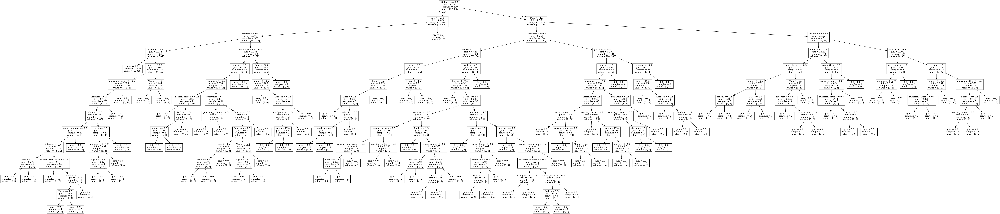

0.8715273631840796
Train: 0.9476961394769614
Test: 0.9104477611940298


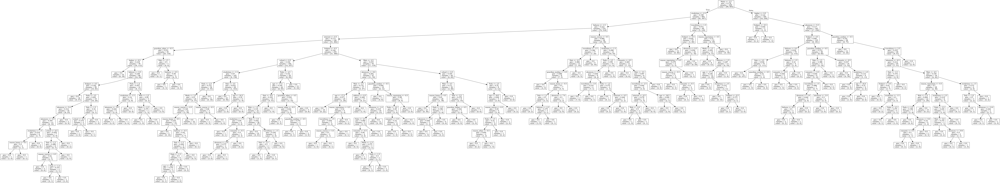

0.8934278606965174
Train: 0.9813200498132005
Test: 0.9850746268656716


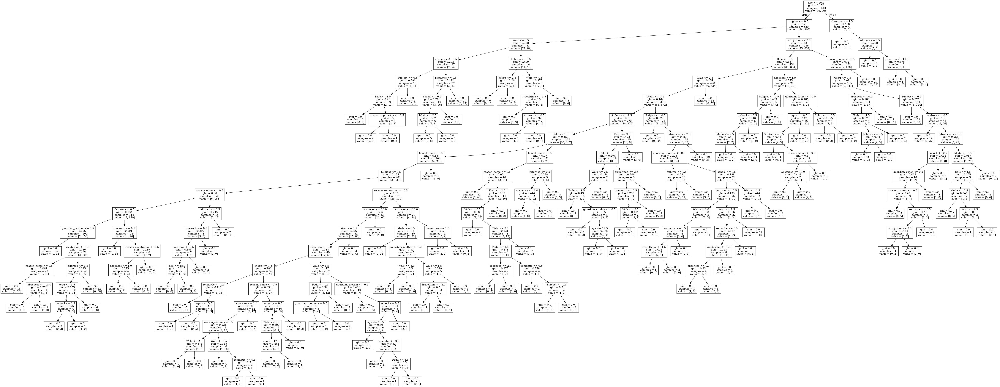

0.8974179104477612
Train: 0.9838107098381071
Test: 0.9850746268656716


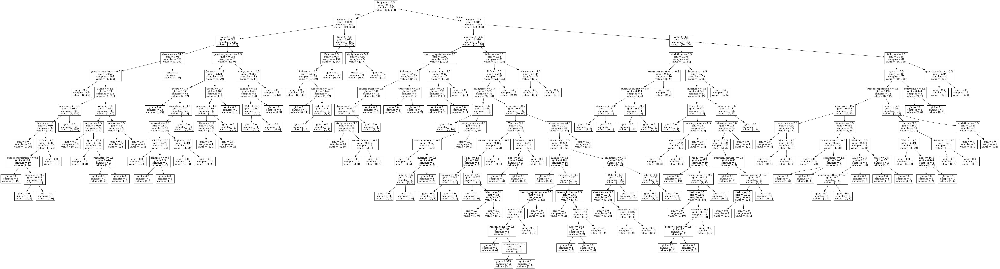

0.9013880597014925
Train: 0.9937733499377335
Test: 1.0


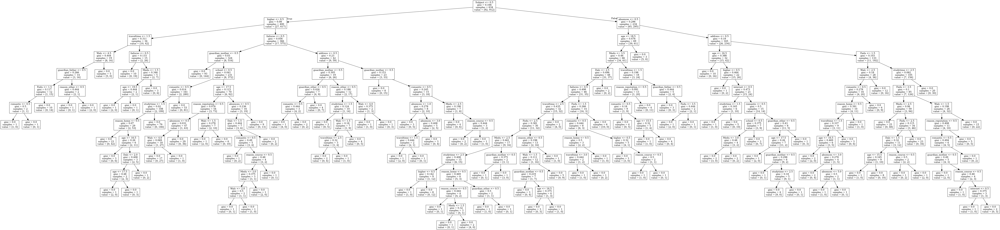

0.9113582089552239
Train: 0.9975093399750934
Test: 1.0


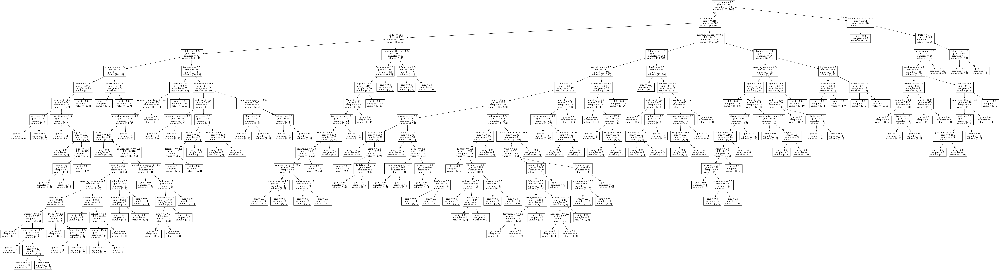

0.9043880597014926
Train: 0.9987546699875467
Test: 1.0


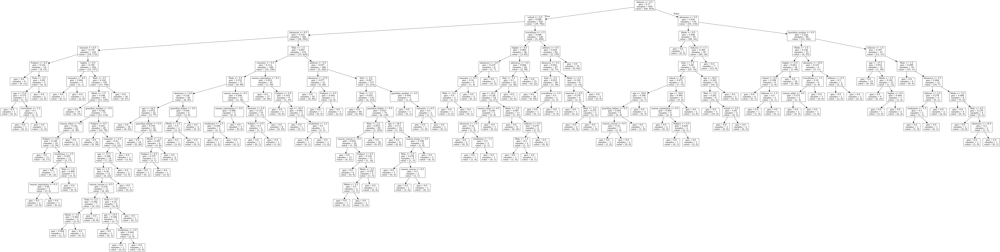

In [158]:
n_estimators= [1,2,3,5,10,20,50,100]
for i in n_estimators:
    cvs = cross_val_score(RandomForestClassifier(n_estimators=i), X, y, cv=5,n_jobs=2)
    
    print( cvs.mean())
    print('Train:',model.score(X_train, y_train))
    print('Test:',model.score(X_test, y_test))
    model = RandomForestClassifier(n_estimators=i).fit(X, y)

  
    graph = Source(export_graphviz(model.estimators_[0], out_file=None, feature_names=feature_names))
    png = graph.pipe(format='png')
    display(Image(png))


#### Видно, что cvs.mean()  растет с увеличением деревьем.При этом при 50 и 100 деревьев результаты праткически одинаковые, поэтому использовать больше 50 неоптимально. 

### Задание 3  
  
* Настройте гиперпараметры модели Random Forest на 5-fold валдиации. В качестве метрики используйте F1-score. Замерьте время, затраченное на вычисления.
* Обучите Random Forest  с настроенными параметрами на всех данных для моделирования. На отложенной выборке оцените качество (F1-score) всего ансамбля и <u>каждого дерева отдельно</u>. Постройте график распределения качества деревьев в ансамбле и сравните результаты с качеством всего леса. Дайте комментарий.  
* Выведите важность признаков в Random Forest, сделайте выводы. 

In [159]:
f1_scorer = make_scorer(f1_score, pos_label="yes")
params_rf = {'n_estimators': [5,10,20,50, 100, 200], 'max_depth': range(2, 7), 'min_samples_split': range(2, 11, 2)}

random_forest = RandomForestClassifier(random_state=17, oob_score = True)
grid_random_forest = GridSearchCV(estimator=random_forest, param_grid = params_rf, cv = 5, scoring=f1_scorer, 
verbose=1, n_jobs = 2)

grid_random_forest.fit(X_train, y_train)

Fitting 5 folds for each of 150 candidates, totalling 750 fits


GridSearchCV(cv=5,
             estimator=RandomForestClassifier(oob_score=True, random_state=17),
             n_jobs=2,
             param_grid={'max_depth': range(2, 7),
                         'min_samples_split': range(2, 11, 2),
                         'n_estimators': [5, 10, 20, 50, 100, 200]},
             scoring=make_scorer(f1_score, pos_label=yes), verbose=1)

In [160]:
def draw_roc_auc_curve(y_test, y_pred_proba,title):
    fpr, tpr, treshold = roc_curve(y_test, y_pred_proba[:,1])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color='darkorange',
         label='ROC кривая (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{title} ROC-кривой')
    plt.legend(loc="lower right")
    plt.show()

Посчитаем f1 для всего ансамбля

Best hyperparameters:
 {'max_depth': 2, 'min_samples_split': 2, 'n_estimators': 5}
F1:  0.9476439790575917


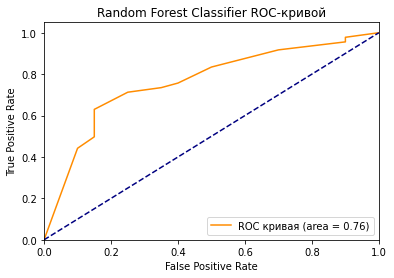

In [161]:
best_hyperparams = grid_random_forest.best_params_
print('Best hyperparameters:\n', best_hyperparams)
best_model_rf = grid_random_forest.best_estimator_
# Predict the test set labels...
y_pred = best_model_rf.predict(X_test)
print('F1: ',f1_score(y_test, y_pred))

y_pred_proba = best_model.predict_proba(X_test)
roc_auc_log = roc_auc_score(y_test, y_pred_proba[:,1])
draw_roc_auc_curve(y_test, y_pred_proba,"Random Forest Classifier")

Подсчитаем и провизуализируем f1 для каждого дерева отдельно(всего 5).Различие на 0,001.

[0.9476439790575917, 0.9414893617021277, 0.9476439790575917, 0.9476439790575917, 0.9476439790575917]


Text(0, 0.5, 'F1 score')

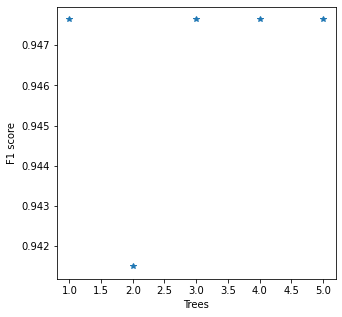

In [162]:
estimator = best_model_rf.estimators_
f1=[]
for tree_in_forest in estimator:
    f1.append(f1_score(y_test,  tree_in_forest.predict(X_test)))
print(f1)
fig = plt.figure(figsize=(5, 5))   
plt.plot([x for x in range(1, len(f1) + 1)], f1, "*")
plt.xlabel('Trees')
plt.ylabel('F1 score')

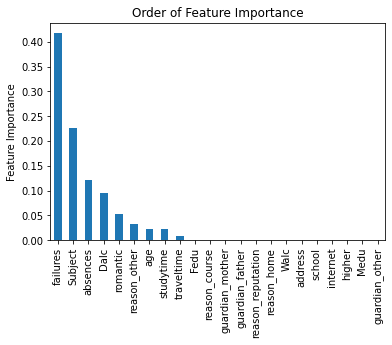

In [163]:
Relative_Feature_importance = pd.Series(best_model_rf.feature_importances_, feature_names).sort_values(ascending=False)
Relative_Feature_importance.plot(kind='bar', title='Order of Feature Importance')
plt.ylabel('Feature Importance')
plt.show()

#### Метрика F1 score (показывает какую часть отрицательных случаев модель правильно классифицирует) показывает неплохие результаты = 0.95. Как видно на графике распределния важности признаков, наибольшую значимость играют failures.

### Задание 4  
  
* Примените логистическую регрессию для решения задачи, подберите оптимальные значения гиперпараметров. Оцените качество (roc auc) на 5-fold валидации из 2 повторений. 
* Аналогично (на такой же валидации (тех же подвыборках) с такой же метрикой) оцените качество Random Forest  с подобранными в предыдущем задании параметрами. Сравните с качеством логистическом регрессии.
* Обучите логистическую модель с настроенными параметрами на всех данных для моделирования. На отложенной выборке оцените качество - постройте ROC-кривую, вычислите roc auc. Вычислите аналогичную метрику для Random Forest из Задания 3, сравните точность моделей. 

Подберем гипер параметры

In [164]:
from sklearn.linear_model import LogisticRegression
parameters = {'penalty' : ['l1', 'l2'], 'C' : np.logspace(-4, 4, 20)}
logit = GridSearchCV(LogisticRegression(random_state=0),parameters,cv = 5, verbose=True, n_jobs=2)
logit.fit(X_train, y_train)
best_hyperparams = logit.best_params_
print('Best hyperparameters:\n', best_hyperparams)
best_model = logit.best_estimator_
# Predict the test set labels...
y_pred = best_model.predict(X_test)
roc_auc_log = roc_auc_score(y_test, y_pred)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best hyperparameters:
 {'C': 0.615848211066026, 'penalty': 'l2'}


Сравним данные двух замеров, видно,что площадь под графиком логистическое регрессии больше.

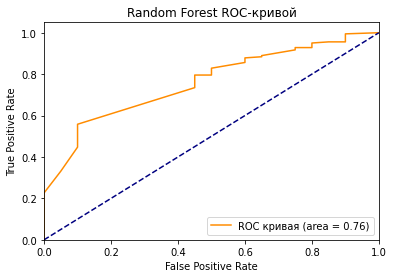

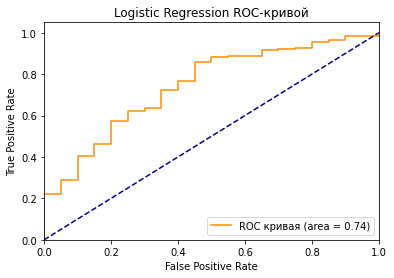

In [165]:
from sklearn.metrics import roc_curve, auc

y_pred_proba = best_model_rf.predict_proba(X_test)
roc_auc_rf = roc_auc_score(y_test, y_pred_proba[:,1])
draw_roc_auc_curve(y_test, y_pred_proba,"Random Forest")


y_pred_proba = best_model.predict_proba(X_test)
roc_auc_log = roc_auc_score(y_test, y_pred_proba[:,1])
draw_roc_auc_curve(y_test, y_pred_proba,"Logistic Regression")

In [166]:
print(f"Roc_auc LogisticRegression = {roc_auc_log}\nRoc_auc Random Forest = {roc_auc_rf}")

Roc_auc LogisticRegression = 0.7439226519337017
Roc_auc Random Forest = 0.7596685082872929


### Задание 5  
  
* Используйте для решения задачи один из фреймворков градиентного бустинга: XGBoost, LightGDB или CatBoost.  
* Оцените на 5-fold валидации, как растет качество модели на обучающей и на тестовой выборках при добавлении каждого дерева. Провизуализируйте результаты.  
* Настройте гиперпараметры модели на 5-fold валидации, в качестве метрики используйте F1-score. Замерьте время, затраченное на вычисления.  
* Обучите модель с настроенными параметрами на всех данных для моделирования и оцените качество на отложенной выборке. Сравните результаты с другими моделями, дайте комментарий.

0.9014179104477613
[05:03:56] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Train: 0.9414694894146949
Test: 0.9104477611940298


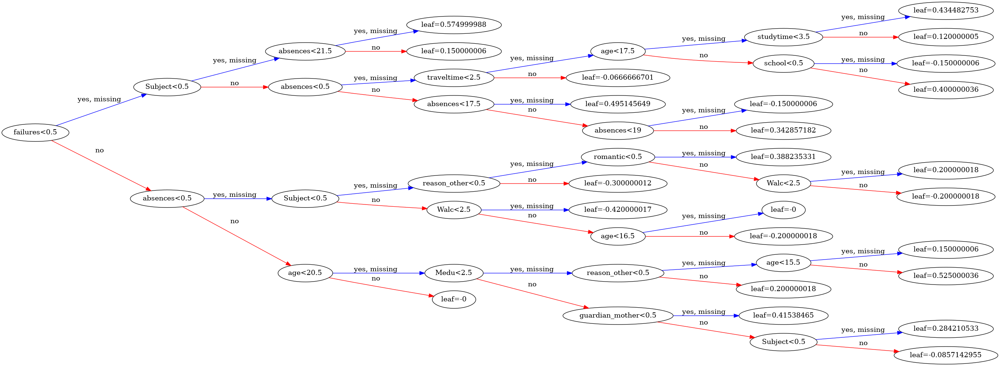

0.9093830845771145
[05:04:01] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Train: 0.9389788293897883
Test: 0.9203980099502488


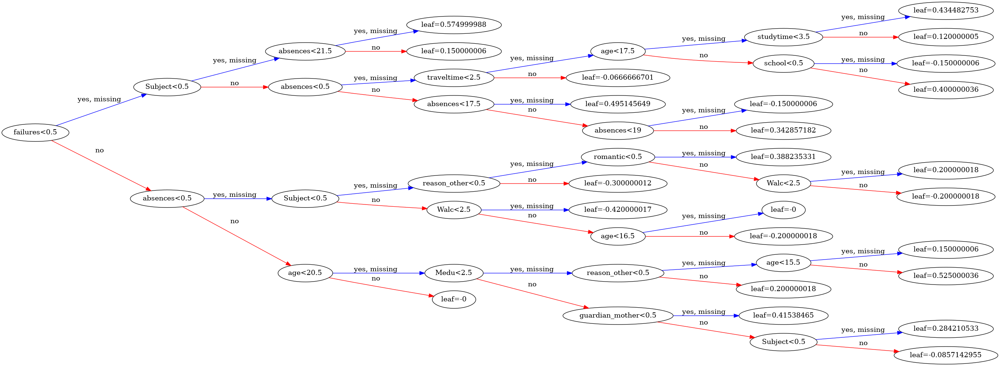

0.9053880597014924
[05:04:09] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Train: 0.9514321295143213
Test: 0.9253731343283582


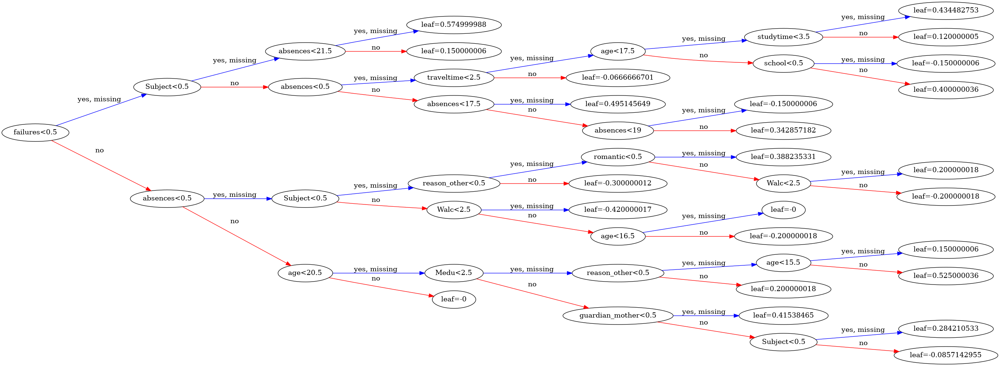

0.9103731343283583
[05:04:22] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Train: 0.9476961394769614
Test: 0.9353233830845771


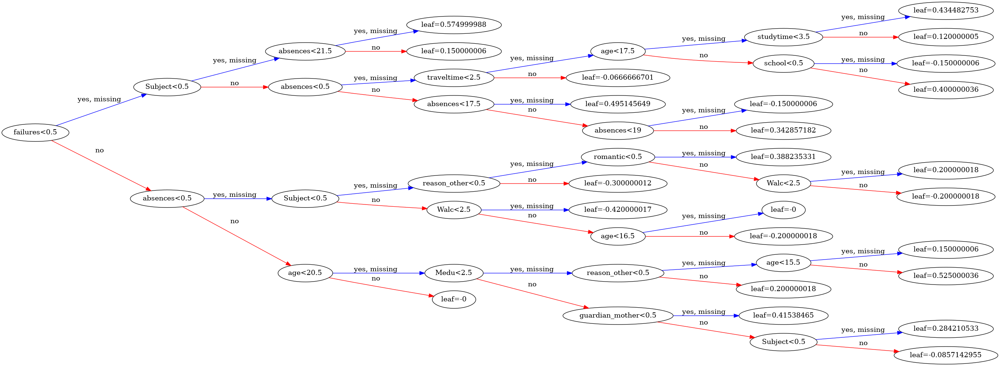

0.9113681592039802
[05:04:47] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Train: 0.9613947696139477
Test: 0.9502487562189055


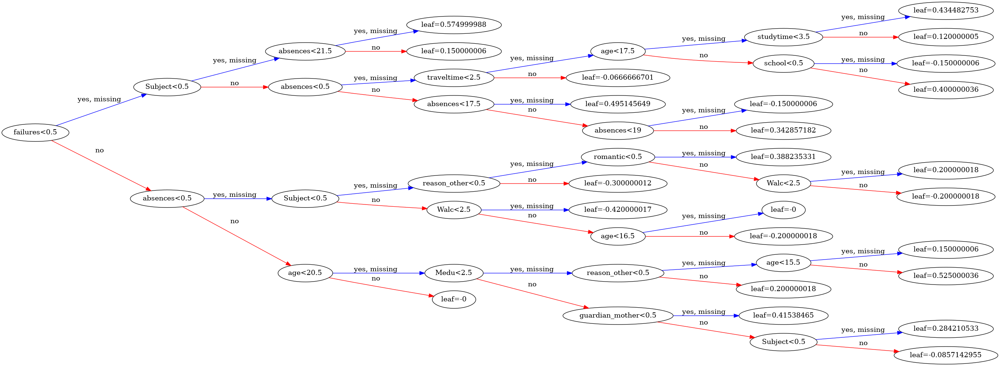

In [168]:
n_estimators= [1,2,3,5,10]
for i in n_estimators:
    cvs = cross_val_score(XGBClassifier(n_estimators=i), X, y, cv=5,n_jobs=2)
    
    print( cvs.mean())
    model = XGBClassifier(n_estimators=i).fit(X, y)
    print('Train:',model.score(X_train, y_train))
    print('Test:',model.score(X_test, y_test))
    
    
    xgb.to_graphviz(model, num_trees=0, rankdir='LR')
    graph = Source(xgb.to_graphviz(model, num_trees=0, rankdir='LR'))
    png = graph.pipe(format='png')
    display(Image(png))  

С увеличением количества деревьев качество растет. Если для одного дерева результат на Test: 0.91, то для 10 Test: 0.950

##  Часть 4. Многоклассовая классификация
  
* Решите задачу многоклассовой классификации: постройте модель, пресдказывающую оценку студента по предмету по 4 балльной шкале
    - Отлично: 18 <= `G3` <= 20
    - Хорошо: 14 <= `G3` <= 17
    - Удовлетворительно: 8 <= `G3` <= 13
    - Неудовлетворительно: `G3` < 8  
  
  При решении задачи **нельзя** использовать признаки `G1` и `G2`.  
  
  
* Для решения задачи примените следующие методы:  
  * KNN  
  * Логистическая регрессия  
  * Деревья решений  
  * Random Forest
  * Gradient Boosting
  
  На кросс-валидации подберите оптимальные значения гиперпараметров алгоритмов.  
  
  
* Оцените качество моделей, используйте confusion matrix и производные от нее метрики. Сделайте выводы.    

In [169]:
from sklearn.metrics import confusion_matrix
import pylab as pl

In [170]:
df.head()

,Subject,school,age,address,Medu,Fedu,traveltime,studytime,failures,higher,internet,romantic,Dalc,Walc,absences,G1,G2,G3,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other
0,0,0,16,1,3,4,1,1,0,1,1,0,1,4,12,15,13,14,1,0,0,0,1,0,0
1,0,0,17,1,3,2,1,2,0,1,1,0,1,3,2,17,18,17,1,0,0,0,0,1,0
2,0,0,16,1,1,2,2,1,2,1,1,0,3,5,0,9,8,10,1,0,0,0,0,1,0
3,0,1,17,1,2,3,2,2,0,1,1,0,1,1,4,14,15,16,0,1,0,0,1,0,0
5,0,0,18,1,3,1,2,1,0,1,1,1,4,5,2,11,11,12,1,0,0,0,0,1,0


In [171]:
df_ = df.copy()

for index, row in df_.iterrows():
    if (df_.at[index, 'G3'] < 8):
        df_.at[index, 'G3'] = 0
    if (df_.at[index, 'G3'] < 14 and df_.at[index, 'G3'] > 7 ):
        df_.at[index, 'G3'] = 1   
    if (df_.at[index, 'G3'] <18 and df_.at[index, 'G3'] >13 ):
        df_.at[index, 'G3'] = 2   
    if (df_.at[index, 'G3'] > 17):
        df_.at[index, 'G3'] = 3
df_.head(15)

,Subject,school,age,address,Medu,Fedu,traveltime,studytime,failures,higher,internet,romantic,Dalc,Walc,absences,G1,G2,G3,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other
0,0,0,16,1,3,4,1,1,0,1,1,0,1,4,12,15,13,2,1,0,0,0,1,0,0
1,0,0,17,1,3,2,1,2,0,1,1,0,1,3,2,17,18,2,1,0,0,0,0,1,0
2,0,0,16,1,1,2,2,1,2,1,1,0,3,5,0,9,8,1,1,0,0,0,0,1,0
3,0,1,17,1,2,3,2,2,0,1,1,0,1,1,4,14,15,2,0,1,0,0,1,0,0
5,0,0,18,1,3,1,2,1,0,1,1,1,4,5,2,11,11,1,1,0,0,0,0,1,0
6,0,1,18,1,1,1,2,2,0,1,0,0,1,1,6,11,12,1,1,0,0,0,0,1,0
7,0,1,15,0,4,4,2,1,0,1,1,1,3,5,0,13,14,2,1,0,0,0,0,1,0
8,1,0,15,1,3,2,1,2,0,1,1,0,1,1,10,7,6,0,0,0,0,1,0,1,0
9,0,1,16,0,3,4,3,2,0,1,0,0,1,2,4,9,10,1,0,0,1,0,0,1,0
10,0,0,15,1,4,4,1,1,0,1,1,0,1,3,0,12,13,1,1,0,0,0,1,0,0


In [172]:
X = df_.drop(["G1", "G2", "G3"], axis = 1)
y = df_["G3"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle=True, random_state = 17, stratify=y)


## Логистическая регрессия

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        20
           1       0.64      0.90      0.75       125
           2       0.50      0.24      0.32        50
           3       0.00      0.00      0.00         6

    accuracy                           0.62       201
   macro avg       0.29      0.28      0.27       201
weighted avg       0.52      0.62      0.55       201



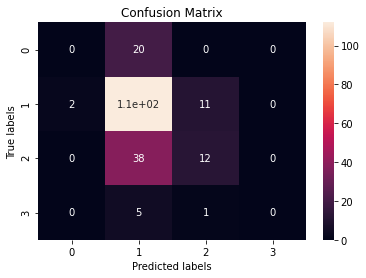

In [173]:
log_reg = LogisticRegression(max_iter = 10000, C=0.1)

log_reg.fit(X_train, y_train)
y_pred=log_reg.predict(X_test)

# accuracy(y_test, y_pred)
print(metrics.classification_report(y_test, y_pred))

ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, ax = ax)

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
plt.show()

Видно, что предсказание очень низкое. Подберем параметры на GridSearchCV

In [174]:
from sklearn.model_selection import  StratifiedKFold
c_values = np.linspace(1e-3, 1, 100)
penal = ['l1', 'l2']
tol = np.linspace(1e-4, 1, 8)
parameters = {'C': c_values, 'penalty': penal, 'tol': tol}
estimator = LogisticRegression(random_state=17, class_weight = 'balanced')
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=17)
model = GridSearchCV(estimator, parameters, cv=skf, scoring='accuracy', n_jobs = -1)
model.fit(X, y)
model.best_estimator_

LogisticRegression(C=0.011090909090909092, class_weight='balanced',
                   random_state=17)

              precision    recall  f1-score   support

           0       0.28      0.50      0.36        20
           1       0.66      0.42      0.51       125
           2       0.36      0.32      0.34        50
           3       0.05      0.33      0.08         6

    accuracy                           0.40       201
   macro avg       0.34      0.39      0.32       201
weighted avg       0.53      0.40      0.44       201



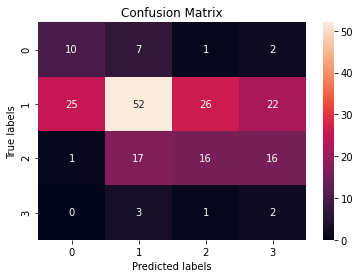

In [175]:
best = model.best_estimator_
best.fit(X_train, y_train)
y_pred=best.predict(X_test)
preds_prob = best.predict_proba(X_test)
# accuracy(y_test, y_pred)
print(metrics.classification_report(y_test, y_pred))

ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, ax = ax)

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
plt.show()

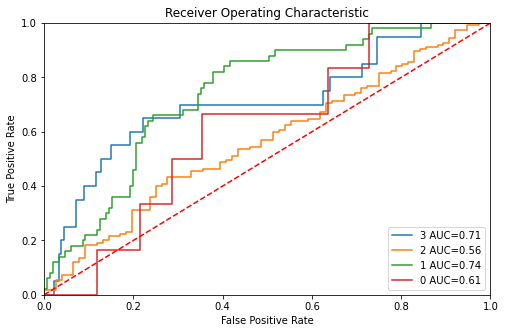

In [176]:
y_val_bin = label_binarize(y_test, classes=np.arange(y_train.nunique()))
plot_roc(y_val_bin, preds_prob, target_names=['3', '2', '1', '0'], figsize=(8,5))

По графику roc кривой видно, что модель хорошо предсказывает 3 (0,73), но не очень хорошо нули.

In [177]:
model.best_score_

0.4432475247524752

### KNN

In [178]:
from sklearn.metrics import accuracy_score
def accuracy(y_test, y_pred):
    print('Accuracy: ', accuracy_score(y_test, y_pred))
KNN = KNeighborsClassifier(n_neighbors=3)
KNN.fit(X_train, y_train)
y_pred = KNN.predict(X_test)

accuracy(y_test, y_pred)

Accuracy:  0.5422885572139303


In [179]:
y_train = y_train.astype('int')
X_train = X_train.astype('int')
X_test = X_test.astype('int')
y_test = y_test.astype('int')

In [180]:
KNN = KNeighborsClassifier(n_neighbors=3)
KNN.fit(X_train, y_train)
y_pred = KNN.predict(X_test)

accuracy(y_test, y_pred)

Accuracy:  0.5422885572139303


              precision    recall  f1-score   support

           0       0.28      0.50      0.36        20
           1       0.66      0.42      0.51       125
           2       0.36      0.32      0.34        50
           3       0.05      0.33      0.08         6

    accuracy                           0.40       201
   macro avg       0.34      0.39      0.32       201
weighted avg       0.53      0.40      0.44       201

ROC AUC: 
    macro: 0.65608 
    weighted: 0.62349


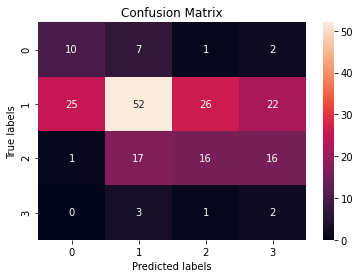

In [181]:
best = model.best_estimator_
best.fit(X_train, y_train)
y_pred=best.predict(X_test)
preds_prob = best.predict_proba(X_test)
print(metrics.classification_report(y_test, y_pred))
print('ROC AUC:',
     '\n    macro:', round(metrics.roc_auc_score(y_test, preds_prob, multi_class='ovr', average='macro'), 5),
     '\n    weighted:', round(metrics.roc_auc_score(y_test, preds_prob, multi_class='ovr', average='weighted'), 5))
ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, ax = ax)

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
plt.show()

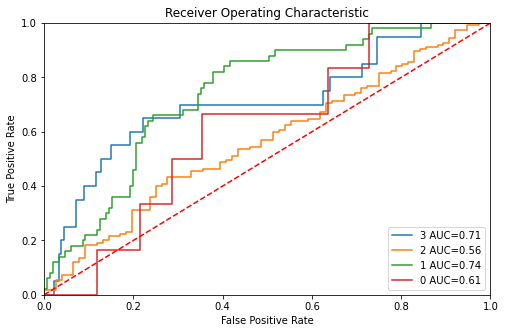

In [182]:
y_val_bin = label_binarize(y_test, classes=np.arange(y_train.nunique()))
plot_roc(y_val_bin, preds_prob, target_names=['3', '2', '1', '0'], figsize=(8,5))

В целом выводы по roc кривой низкие, очень близки к рандому.

## Дерево решений

Maximal accuracy score: 0.6218905472636815


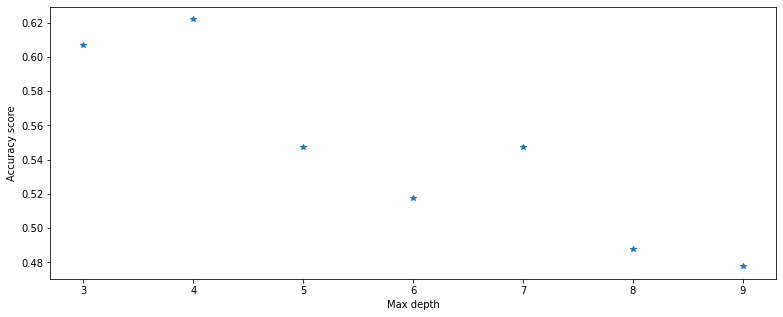

In [183]:
acc = []

for i in range(3, 10):
    estimator = DecisionTreeClassifier(random_state=17, max_depth = i).fit(X_train, y_train)
    acc.append(accuracy_score(estimator.predict(X_test), y_test))

fig = plt.figure(figsize=(13, 5))

plt.plot(range(3, 10), acc, "*")
plt.xlabel('Max depth')
plt.ylabel('Accuracy score')

print(f'Maximal accuracy score: {max(acc)}')

In [184]:
md = range(3, 10)
parameters = {'max_depth': md}
estimator = DecisionTreeClassifier(random_state=17)
clf = GridSearchCV(estimator, parameters, scoring='accuracy', cv=skf, n_jobs = -1)
clf.fit(X, y)
clf.best_estimator_

DecisionTreeClassifier(max_depth=3, random_state=17)

0.6374554455445544
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        20
           1       0.62      0.98      0.76       125
           2       0.00      0.00      0.00        50
           3       0.00      0.00      0.00         6

    accuracy                           0.61       201
   macro avg       0.15      0.24      0.19       201
weighted avg       0.38      0.61      0.47       201

ROC AUC: 
    macro: 0.59899 
    weighted: 0.61836


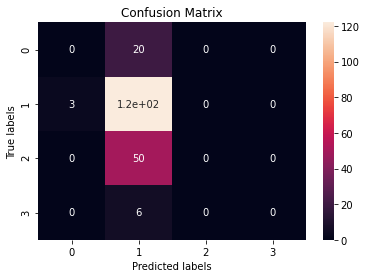

In [185]:
best = clf.best_estimator_
best.fit(X_train, y_train)
y_pred=best.predict(X_test)
preds_prob = best.predict_proba(X_test)
print(clf.best_score_)
print(metrics.classification_report(y_test, y_pred))
print('ROC AUC:',
     '\n    macro:', round(metrics.roc_auc_score(y_test, preds_prob, multi_class='ovr', average='macro'), 5),
     '\n    weighted:', round(metrics.roc_auc_score(y_test, preds_prob, multi_class='ovr', average='weighted'), 5))
ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, ax = ax)

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
plt.show()

## Random Forest

In [186]:
rf = RandomForestClassifier(random_state=17, oob_score = True).fit(X, y)
rf.oob_score_

0.6623505976095617

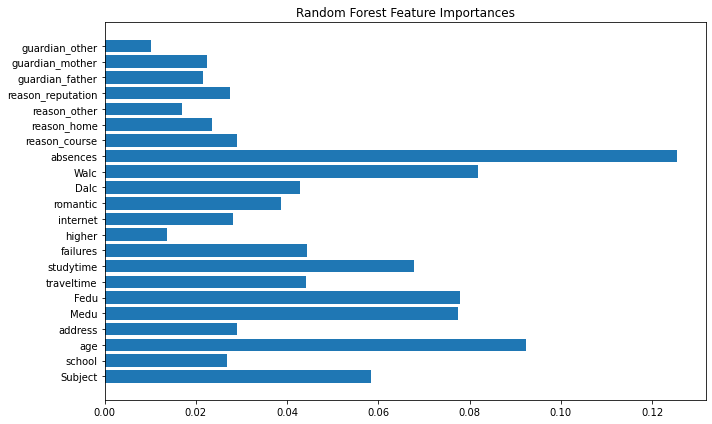

In [187]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(X.columns, rf.feature_importances_)
ax.set_yticklabels(X.columns)
ax.set_yticks(X.columns)
ax.set_title("Random Forest Feature Importances")
fig.tight_layout()
plt.show()

In [188]:
n_estimators = [5,10,20,50, 100, 200, 300]
md = range(3, 8)
parameters = {'n_estimators': n_estimators, 'max_depth': md}
estimator = RandomForestClassifier(random_state=17, oob_score = True)
clf = GridSearchCV(estimator, parameters, scoring='accuracy', cv=skf, n_jobs = -1)
clf.fit(X_train, y_train)
clf.best_estimator_

RandomForestClassifier(max_depth=7, n_estimators=300, oob_score=True,
                       random_state=17)

0.6624845679012346
              precision    recall  f1-score   support

           0       0.50      0.05      0.09        20
           1       0.65      0.94      0.77       125
           2       0.58      0.22      0.32        50
           3       0.00      0.00      0.00         6

    accuracy                           0.64       201
   macro avg       0.43      0.30      0.29       201
weighted avg       0.60      0.64      0.57       201

ROC AUC: 
    macro: 0.67116 
    weighted: 0.64377


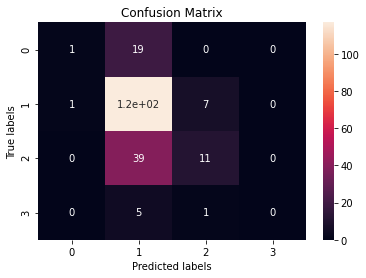

In [189]:
best = clf.best_estimator_
best.fit(X_train, y_train)
y_pred=best.predict(X_test)
preds_prob = best.predict_proba(X_test)
print(clf.best_score_)
print(metrics.classification_report(y_test, y_pred))
print('ROC AUC:',
     '\n    macro:', round(metrics.roc_auc_score(y_test, preds_prob, multi_class='ovr', average='macro'), 5),
     '\n    weighted:', round(metrics.roc_auc_score(y_test, preds_prob, multi_class='ovr', average='weighted'), 5))
ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, ax = ax)

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
plt.show()

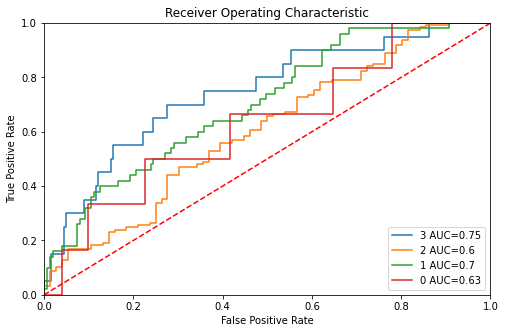

In [190]:
y_val_bin = label_binarize(y_test, classes=np.arange(y_train.nunique()))
plot_roc(y_val_bin, preds_prob, target_names=['3', '2', '1', '0'], figsize=(8,5))

Maximal score: 0.6354581673306773


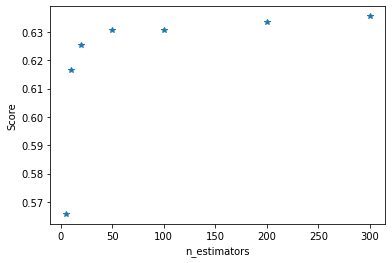

In [191]:
score = []

for n in n_estimators:
    rf = RandomForestClassifier(random_state=17, n_estimators=n, oob_score = True, max_depth=5).fit(X, y)
    score.append(rf.oob_score_)

plt.plot(n_estimators, score, "*")
plt.xlabel('n_estimators')
plt.ylabel('Score')

print(f'Maximal score: {max(score)}')

Вывод: в многоклассовой классификации модель, построенная с помощью дерева решений, проявила себя наилучшим образом.
В бинарной классификации высокую точность можно объяснить преобладающим количеством определенной оценки и переобучением модели.

## GradientBoostingClassifier